<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Import Needed Libraries</h2>
</div>

In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="jSWUfpfPHjYnupxAx9Jn")
project = rf.workspace("roboflow-universe-projects").project("license-plate-recognition-rxg4e")
version = project.version(4)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.6/88.6 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 39.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 78.1 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to License-Plate-Recognition-4 in yolov8:: 100%|██████████| 48488/48488 [00:06<00:00, 7167.21it/s]


In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 47.5 MB/s eta 0:00:00


In [3]:
import cv2
import os
import PIL
import yaml
import torch
import random
import pandas as pd
from sklearn.utils import shuffle
import numpy as np
from glob import glob
from PIL import Image
import matplotlib.pyplot as plt
import ultralytics
from ultralytics import YOLO
import warnings
warnings.simplefilter('ignore')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Reading Dataset And Get Info</h2>
</div>

#### Check Format and MisMatching Labels with Images

In [ ]:
def Detect_FormatOfFiles(src_dir):
    path = f'{src_dir}'
    s = set()
    for filename in os.listdir(path):
        s.add(filename.split('.')[-1])
    print(f'{src_dir} Contain {s} Files Format')

In [ ]:
Detect_FormatOfFiles('/content/License-Plate-Recognition-4/test/images')
Detect_FormatOfFiles('/content/License-Plate-Recognition-4/test/labels')
Detect_FormatOfFiles('/content/License-Plate-Recognition-4/valid/images')
Detect_FormatOfFiles('/content/License-Plate-Recognition-4/valid/labels')
Detect_FormatOfFiles('/content/License-Plate-Recognition-4/train/images')
Detect_FormatOfFiles('/content/License-Plate-Recognition-4/train/labels')

/content/License-Plate-Recognition-4/test/images Contain {'jpg'} Files Format
/content/License-Plate-Recognition-4/test/labels Contain {'txt'} Files Format
/content/License-Plate-Recognition-4/valid/images Contain {'jpg'} Files Format
/content/License-Plate-Recognition-4/valid/labels Contain {'txt'} Files Format
/content/License-Plate-Recognition-4/train/images Contain {'jpg'} Files Format
/content/License-Plate-Recognition-4/train/labels Contain {'txt'} Files Format


In [ ]:
def Detect_MissMatching_Labels(dir_image,dir_labels):
    path_image = f'{dir_image}'
    path_label = f'{dir_labels}'
    for filename in os.listdir(dir_image):
        image_label = filename[:-3] + 'txt'
        if image_label not in os.listdir(dir_labels):
            print(f'{filename} Not Match with Label in {dir_image}')

Detect_MissMatching_Labels('/content/License-Plate-Recognition-4/train/images','/content/License-Plate-Recognition-4/train/labels')
print(50*'#')
Detect_MissMatching_Labels('/content/License-Plate-Recognition-4/valid/images','/content/License-Plate-Recognition-4/valid/labels')
print(50*'#')
Detect_MissMatching_Labels('/content/License-Plate-Recognition-4/test/images','/content/License-Plate-Recognition-4/test/labels')

##################################################
##################################################


In [ ]:
print("Number of images in train set:", len(os.listdir('/content/License-Plate-Recognition-4/train/images')))
print(50*'*')
print("Number of images in validate set:", len(os.listdir('/content/License-Plate-Recognition-4/valid/images')))
print(50*'*')
print("Number of images in test set:", len(os.listdir('/content/License-Plate-Recognition-4/test/images')))

Number of images in train set: 21173
**************************************************
Number of images in validate set: 2046
**************************************************
Number of images in test set: 1019


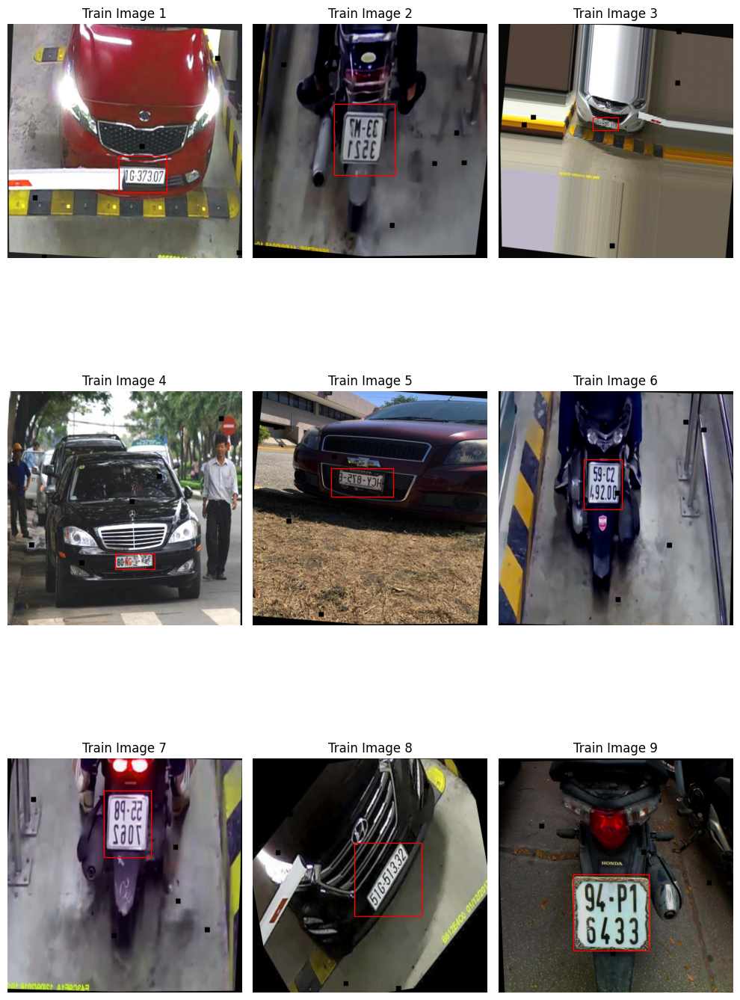

In [ ]:
plt.figure(figsize=(10,16))
train_images = os.listdir('/content/License-Plate-Recognition-4/train/images')
random.shuffle(train_images)
for i in range(9):
    img_path = f'/content/License-Plate-Recognition-4/train/images/{train_images[i]}'
    img = Image.open(img_path)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.title(f'Train Image {i + 1}')
    label_file_name = f"/content/License-Plate-Recognition-4/train/labels/{train_images[i][:-3]}txt"
    box_bounding = label_file_name
    with open(box_bounding, 'r') as f:
        lines = f.readlines()
        for line in lines:
            class_id, x_center, y_center, width, height = map(float, line.split())
            x_center *= img.width
            y_center *= img.height
            width *= img.width
            height *= img.height
            x1 = int(x_center - width / 2)
            y1 = int(y_center - height / 2)
            x2 = int(x_center + width / 2)
            y2 = int(y_center + height / 2)
            plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', facecolor='none'))
plt.tight_layout()
plt.show()

<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Modeling</h2>
</div>

In [4]:
model = YOLO('yolov8n.pt')

In [6]:
model.train(
    data='/content/License-Plate-Recognition-4/data.yaml',
    epochs=30,
    imgsz=640,
    batch=16,
    name='license_plate'
)

Ultralytics 8.3.181 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/License-Plate-Recognition-4/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=license_plate2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=

train: Scanning /content/License-Plate-Recognition-4/train/labels.cache... 21173 images, 28 backgrounds, 0 corrupt: 100%|██████████| 21173/21173 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 489.4±278.9 MB/s, size: 35.9 KB)


val: Scanning /content/License-Plate-Recognition-4/valid/labels.cache... 2046 images, 3 backgrounds, 0 corrupt: 100%|██████████| 2046/2046 [00:00<?, ?it/s]


Plotting labels to runs/detect/license_plate2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/license_plate2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.39G      1.223     0.8319      1.229          3        640: 100%|██████████| 1324/1324 [06:14<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:15<00:00,  4.05it/s]

                   all       2046       2132      0.906      0.894      0.934      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.79G      1.279     0.7876      1.275          8        640: 100%|██████████| 1324/1324 [05:59<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:15<00:00,  4.21it/s]

                   all       2046       2132      0.936      0.879      0.944      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.79G      1.254     0.7499      1.268          6        640: 100%|██████████| 1324/1324 [05:53<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.37it/s]


                   all       2046       2132       0.95        0.9      0.944      0.611

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.81G      1.224     0.7019      1.247          8        640: 100%|██████████| 1324/1324 [05:51<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.38it/s]

                   all       2046       2132      0.952      0.921      0.953      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.82G      1.198     0.6684      1.233          9        640: 100%|██████████| 1324/1324 [05:49<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:15<00:00,  4.20it/s]

                   all       2046       2132      0.968      0.925      0.964      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.82G      1.177     0.6393      1.219          7        640: 100%|██████████| 1324/1324 [05:41<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.47it/s]

                   all       2046       2132      0.963       0.94      0.967      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.82G      1.166     0.6187      1.207         15        640: 100%|██████████| 1324/1324 [05:44<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.48it/s]


                   all       2046       2132      0.975      0.937      0.971       0.65

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.82G      1.149     0.6039      1.199          5        640: 100%|██████████| 1324/1324 [05:44<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:15<00:00,  4.26it/s]

                   all       2046       2132      0.968      0.943      0.972      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.82G      1.136     0.5837      1.192         12        640: 100%|██████████| 1324/1324 [05:46<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.34it/s]

                   all       2046       2132      0.973       0.94      0.976      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.82G      1.124     0.5703      1.184         10        640: 100%|██████████| 1324/1324 [05:48<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.46it/s]

                   all       2046       2132      0.973      0.939      0.971      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.84G      1.116     0.5632      1.181          7        640: 100%|██████████| 1324/1324 [05:44<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:15<00:00,  4.14it/s]


                   all       2046       2132      0.969      0.951      0.975      0.673

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.84G      1.103     0.5526      1.175          8        640: 100%|██████████| 1324/1324 [05:43<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.43it/s]

                   all       2046       2132      0.979      0.947      0.979      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.84G      1.091     0.5431      1.168          7        640: 100%|██████████| 1324/1324 [05:45<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:15<00:00,  4.14it/s]

                   all       2046       2132      0.971       0.95      0.975      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.84G       1.09     0.5363      1.169          8        640: 100%|██████████| 1324/1324 [05:46<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.43it/s]

                   all       2046       2132      0.972      0.952      0.977      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.84G      1.078     0.5253      1.156         11        640: 100%|██████████| 1324/1324 [05:45<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:15<00:00,  4.19it/s]

                   all       2046       2132      0.976       0.95      0.979      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.84G      1.072     0.5151      1.153         14        640: 100%|██████████| 1324/1324 [05:45<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.48it/s]


                   all       2046       2132      0.974      0.953      0.978       0.68

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.84G      1.056     0.5017      1.147          7        640: 100%|██████████| 1324/1324 [05:45<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.27it/s]

                   all       2046       2132      0.977      0.956      0.981      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.84G      1.049     0.4966      1.142          8        640: 100%|██████████| 1324/1324 [05:47<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.37it/s]

                   all       2046       2132      0.977      0.954      0.981      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.84G      1.044     0.4908      1.137          6        640: 100%|██████████| 1324/1324 [05:46<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.56it/s]


                   all       2046       2132      0.977      0.957      0.982      0.692

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.84G      1.037     0.4836      1.133          6        640: 100%|██████████| 1324/1324 [05:44<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.45it/s]


                   all       2046       2132      0.975      0.953       0.98      0.688
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.84G      1.018     0.4076      1.164          5        640: 100%|██████████| 1324/1324 [05:32<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.44it/s]


                   all       2046       2132      0.981      0.951      0.982      0.697

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.84G      1.004     0.3959       1.15          5        640: 100%|██████████| 1324/1324 [05:31<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.48it/s]


                   all       2046       2132      0.978       0.96      0.983      0.698

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.84G     0.9934     0.3909      1.149          6        640: 100%|██████████| 1324/1324 [05:31<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.51it/s]


                   all       2046       2132      0.974      0.959      0.984      0.701

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.84G     0.9827     0.3841      1.138          5        640: 100%|██████████| 1324/1324 [05:28<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.51it/s]

                   all       2046       2132      0.974      0.964      0.983      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.84G     0.9736     0.3784      1.133          5        640: 100%|██████████| 1324/1324 [05:30<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.42it/s]


                   all       2046       2132      0.982       0.96      0.985      0.707

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.84G     0.9605     0.3673      1.125          5        640: 100%|██████████| 1324/1324 [05:28<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.30it/s]

                   all       2046       2132       0.98      0.961      0.984      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.84G     0.9523     0.3636      1.122          4        640: 100%|██████████| 1324/1324 [05:30<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.44it/s]

                   all       2046       2132      0.978      0.964      0.985      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.84G     0.9433     0.3568      1.115          7        640: 100%|██████████| 1324/1324 [05:29<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.43it/s]

                   all       2046       2132      0.979      0.963      0.985      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.84G     0.9339     0.3519      1.108          5        640: 100%|██████████| 1324/1324 [05:29<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.50it/s]

                   all       2046       2132       0.98      0.965      0.984      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.84G     0.9256     0.3428      1.105          5        640: 100%|██████████| 1324/1324 [05:31<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:14<00:00,  4.50it/s]


                   all       2046       2132      0.982      0.963      0.984      0.702

30 epochs completed in 2.979 hours.
Optimizer stripped from runs/detect/license_plate2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/license_plate2/weights/best.pt, 6.2MB

Validating runs/detect/license_plate2/weights/best.pt...
Ultralytics 8.3.181 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:16<00:00,  3.77it/s]


                   all       2046       2132       0.98       0.96      0.985      0.706
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/license_plate2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a356c0985f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [8]:
# Evaluate the trained model on Validate Images
best_model = YOLO('/content/runs/detect/license_plate2/weights/best.pt')
metrics = best_model.val(
    data="/content/License-Plate-Recognition-4/data.yaml",
    split="val",
)

Ultralytics 8.3.181 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1529.1±489.3 MB/s, size: 37.5 KB)


val: Scanning /content/License-Plate-Recognition-4/valid/labels.cache... 2046 images, 3 backgrounds, 0 corrupt: 100%|██████████| 2046/2046 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [00:20<00:00,  6.27it/s]


                   all       2046       2132       0.98      0.961      0.985      0.707
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/val


In [9]:
# Evaluate the trained model on Test Images
metrics = best_model.val(
    data="/content/License-Plate-Recognition-4/data.yaml",
    split="test",
)

Ultralytics 8.3.181 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1332.2±396.1 MB/s, size: 38.3 KB)


val: Scanning /content/License-Plate-Recognition-4/test/labels... 1019 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1019/1019 [00:00<00:00, 1747.10it/s]


val: New cache created: /content/License-Plate-Recognition-4/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:10<00:00,  6.25it/s]


                   all       1019       1048      0.989      0.967      0.988      0.711
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/val2


In [10]:
!zip -r runs.zip /content/runs
from google.colab import files
files.download("runs.zip")


updating: content/runs/ (stored 0%)
updating: content/runs/detect/ (stored 0%)
updating: content/runs/detect/license_plate/ (stored 0%)
updating: content/runs/detect/license_plate/labels.jpg (deflated 50%)
updating: content/runs/detect/license_plate/weights/ (stored 0%)
updating: content/runs/detect/license_plate/train_batch2.jpg (deflated 3%)
updating: content/runs/detect/license_plate/labels_correlogram.jpg (deflated 30%)
updating: content/runs/detect/license_plate/args.yaml (deflated 52%)
updating: content/runs/detect/license_plate/train_batch0.jpg (deflated 4%)
updating: content/runs/detect/license_plate/train_batch1.jpg (deflated 4%)
updating: content/runs/detect/license_plate2/ (stored 0%)
updating: content/runs/detect/license_plate2/labels.jpg (deflated 50%)
updating: content/runs/detect/license_plate2/BoxPR_curve.png (deflated 26%)
updating: content/runs/detect/license_plate2/val_batch0_pred.jpg (deflated 6%)
updating: content/runs/detect/license_plate2/results.png (deflated 8%

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Evaluate the Model on Validation Images</h2>
</div>

#### Validate Batch 0

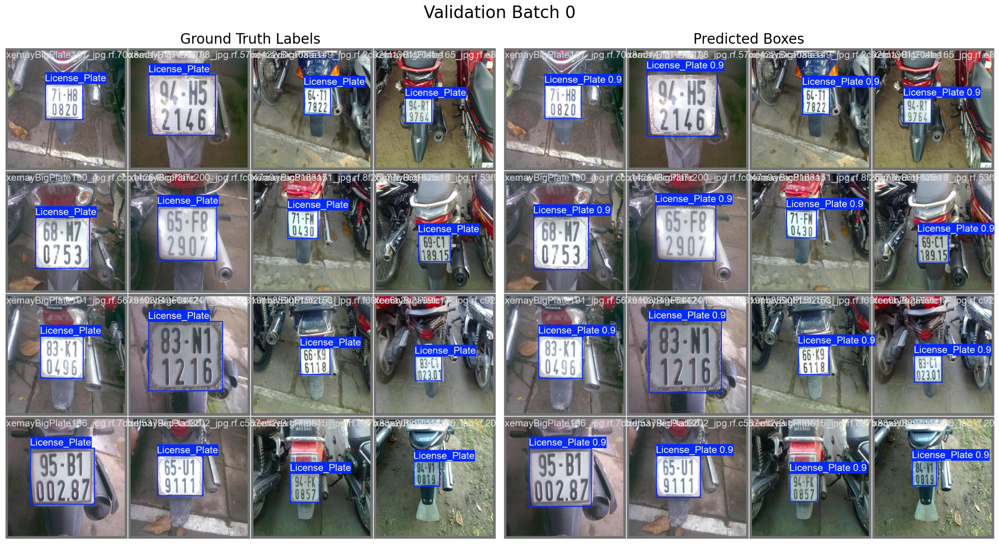

In [11]:
import matplotlib.image as mpimg
img1 = mpimg.imread('/content/runs/detect/val/val_batch0_labels.jpg')
img2 = mpimg.imread('/content/runs/detect/val/val_batch0_pred.jpg')

plt.figure(figsize=(20, 12))

plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title('Ground Truth Labels', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title('Predicted Boxes', fontsize=20)
plt.axis('off')

plt.suptitle('Validation Batch 0', fontsize=24)

plt.tight_layout()
plt.subplots_adjust(top=0.99)
plt.show()

#### Validate Batch 1

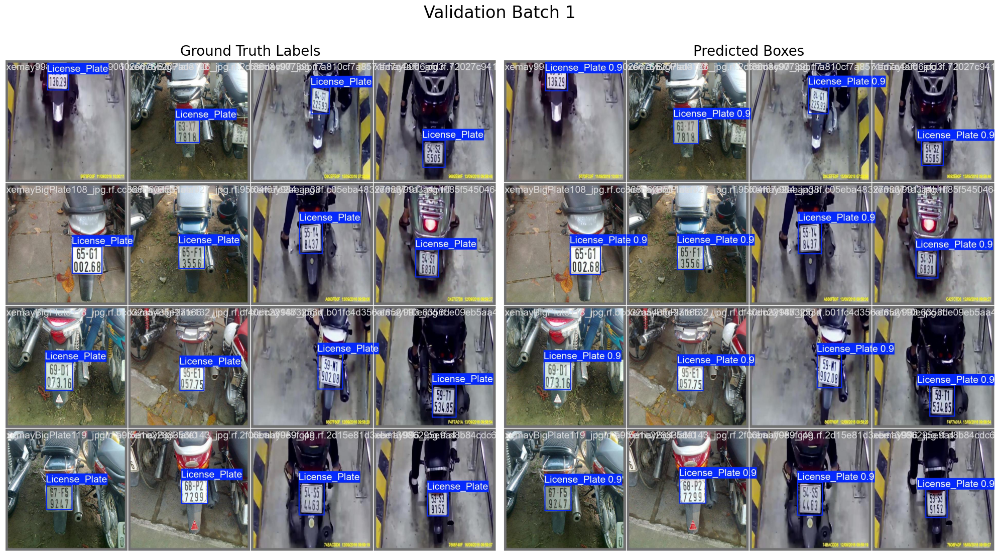

In [12]:
img1 = mpimg.imread('/content/runs/detect/val/val_batch1_labels.jpg')
img2 = mpimg.imread('/content/runs/detect/val/val_batch1_pred.jpg')

plt.figure(figsize=(20, 12))

plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title('Ground Truth Labels', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title('Predicted Boxes', fontsize=20)
plt.axis('off')

plt.suptitle('Validation Batch 1', fontsize=24)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()


#### Validate Batch 2

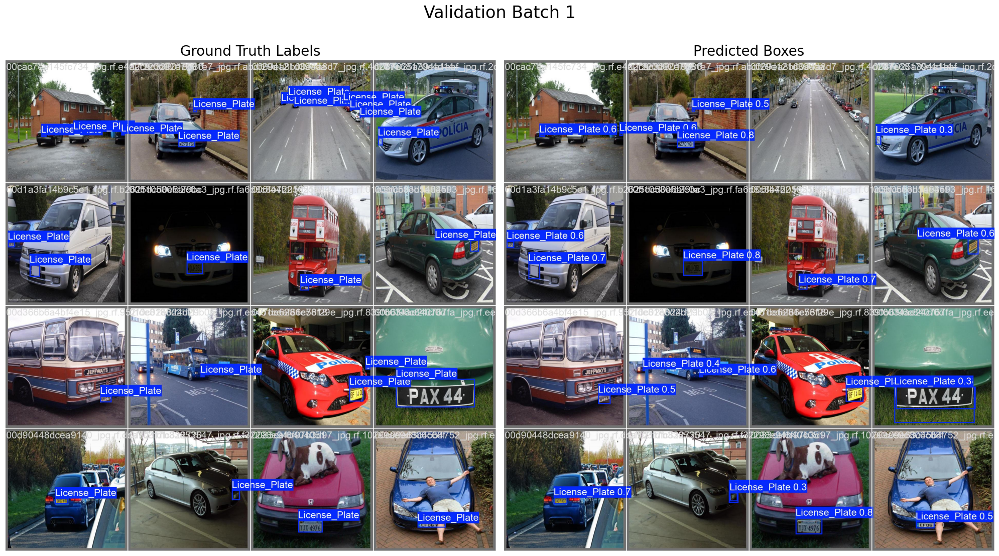

In [13]:
img1 = mpimg.imread('/content/runs/detect/val/val_batch2_labels.jpg')
img2 = mpimg.imread('/content/runs/detect/val/val_batch2_pred.jpg')

plt.figure(figsize=(20, 12))

plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title('Ground Truth Labels', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title('Predicted Boxes', fontsize=20)
plt.axis('off')

plt.suptitle('Validation Batch 1', fontsize=24)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

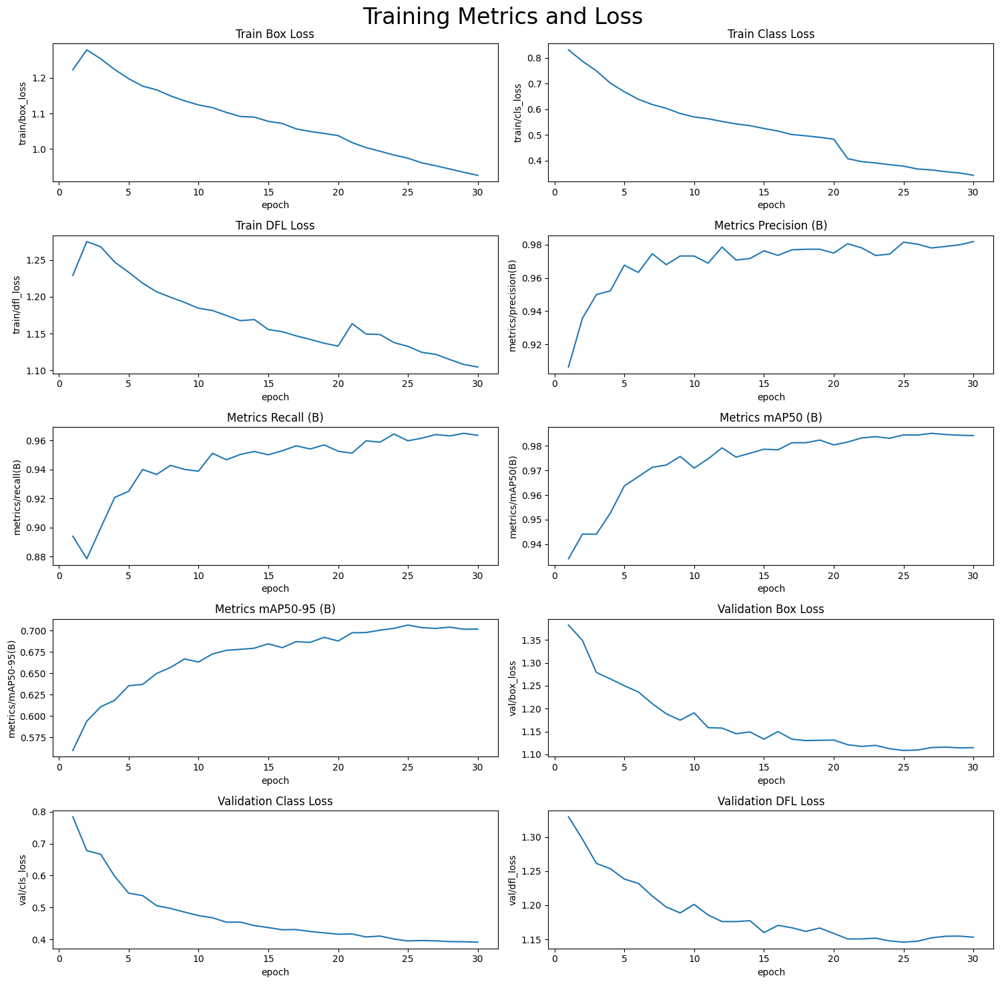

In [14]:
%matplotlib inline
import seaborn as sns
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/content/runs/detect/license_plate2/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

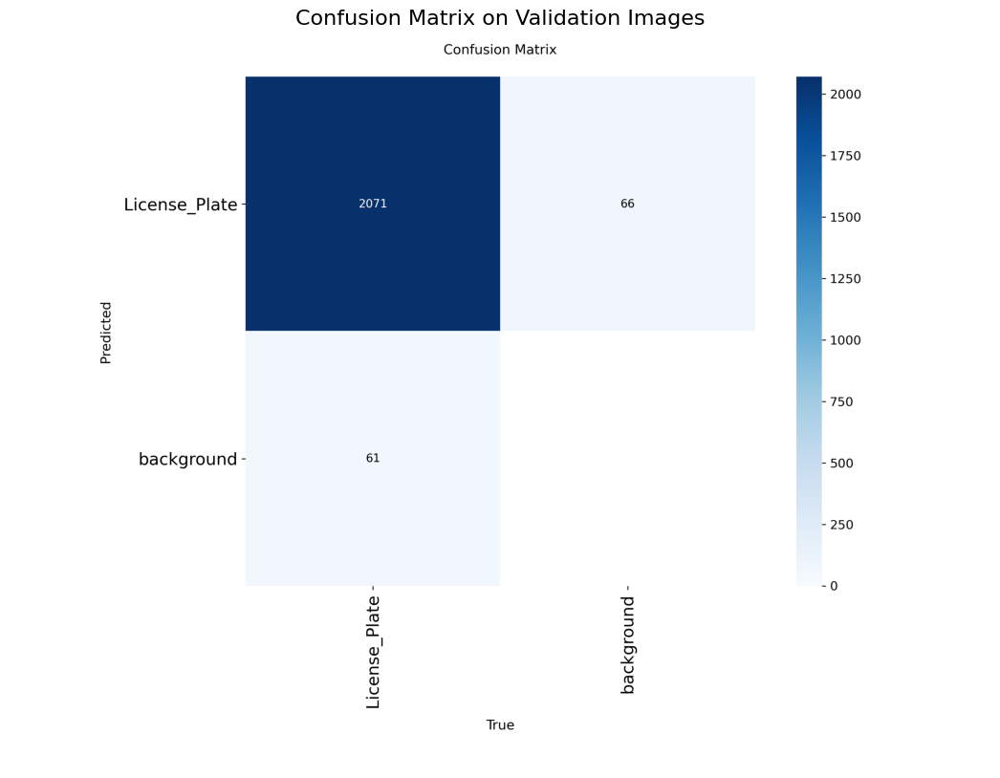

In [15]:
img = mpimg.imread('/content/runs/detect/val/confusion_matrix.png')

plt.figure(figsize=(16, 10))
plt.imshow(img)
plt.axis('off')
plt.title("Confusion Matrix on Validation Images", fontsize=16)
plt.show()

<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Evaluate the Model on Test Images</h2>
</div>

#### Confusion Matrix on Test Images

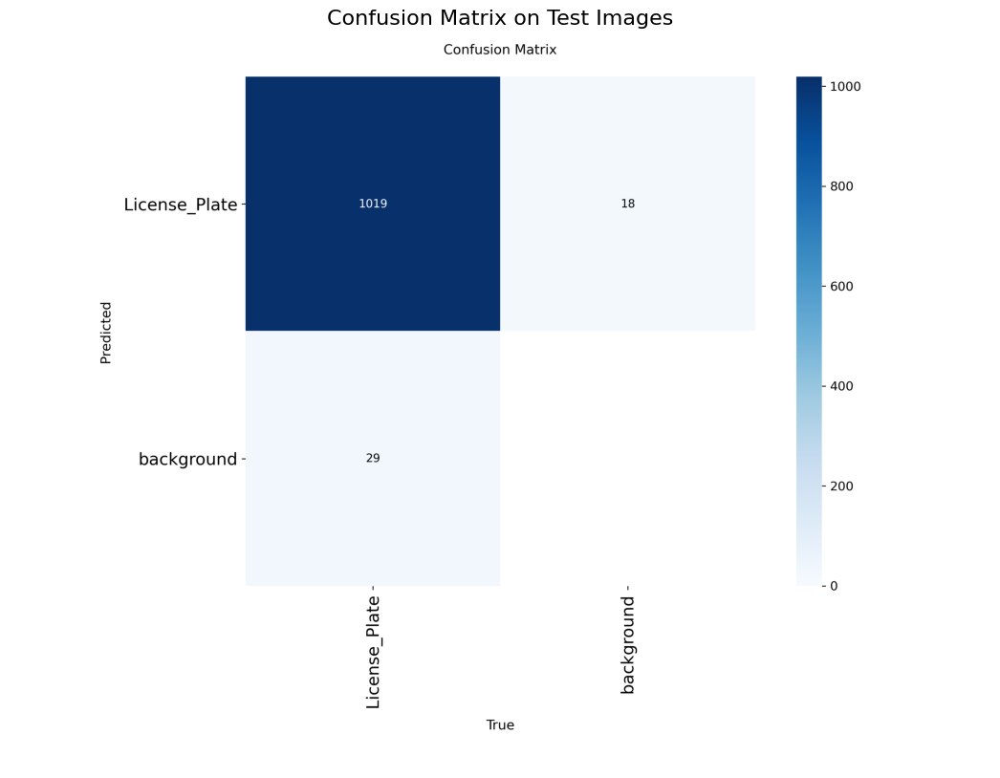

In [16]:
img = mpimg.imread('/content/runs/detect/val2/confusion_matrix.png')

plt.figure(figsize=(16, 10))
plt.imshow(img)
plt.axis('off')
plt.title("Confusion Matrix on Test Images", fontsize=16)
plt.show()

#### Predict on Random Test Images

In [22]:
def ODImage(src_dir, image):
    img_path = os.path.join(src_dir, image)

    yolo_outputs = best_model.predict(img_path)
    output = yolo_outputs[0]
    box = output.boxes
    names = output.names

    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # ---- Load Ground Truth ----
    gt_boxes = []
    label_file = image[:-3] + '.txt'
    label_path = os.path.join(src_dir.replace('images', 'labels'), label_file)

    if os.path.exists(label_path):
        h, w, _ = img.shape
        with open(label_path, 'r') as f:
            for line in f:
                cls, xc, yc, bw, bh = map(float, line.strip().split())
                label_true = names[int(cls)]
                x1 = int((xc - bw / 2) * w)
                y1 = int((yc - bh / 2) * h)
                x2 = int((xc + bw / 2) * w)
                y2 = int((yc + bh / 2) * h)
                gt_boxes.append((x1, y1, x2, y2, label_true))

    # ---- Predictions ----
    for j in range(len(box)):
        label_pred = names[box.cls[j].item()]
        x1, y1, x2, y2 = map(int, box.xyxy[j].tolist())
        conf = np.round(box.conf[j].item(), 2)
        pred_text = f"Pred: {label_pred} ({conf})"

        # Prediction label above
        cv2.putText(img_rgb, pred_text, (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # ---- Ground Truth ----
    for (x1, y1, x2, y2, label_true) in gt_boxes:
        true_text = f"True: {label_true}"
        cv2.putText(img_rgb, true_text, (x1, y2 + 20),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)

    return img_rgb


image 1/1 /content/License-Plate-Recognition-4/test/images/CarLongPlateGen880_jpg.rf.31fc63d3b7a84b3187e7615609d79573.jpg: 640x640 1 License_Plate, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/License-Plate-Recognition-4/test/images/xemay207_jpg.rf.3f203a276200b60478d8e08afc12c930.jpg: 640x640 1 License_Plate, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/License-Plate-Recognition-4/test/images/xemay1868_jpg.rf.e54fc6fc3df062562b72f8b35a0358d1.jpg: 640x640 1 License_Plate, 10.4ms
Speed: 2.1ms preprocess, 10.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/License-Plate-Recognition-4/test/images/CarLongPlateGen3298_jpg.rf.c683b39f22040d2ba9fce2c231775b28.jpg: 640x640 1 License_Plate, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

image

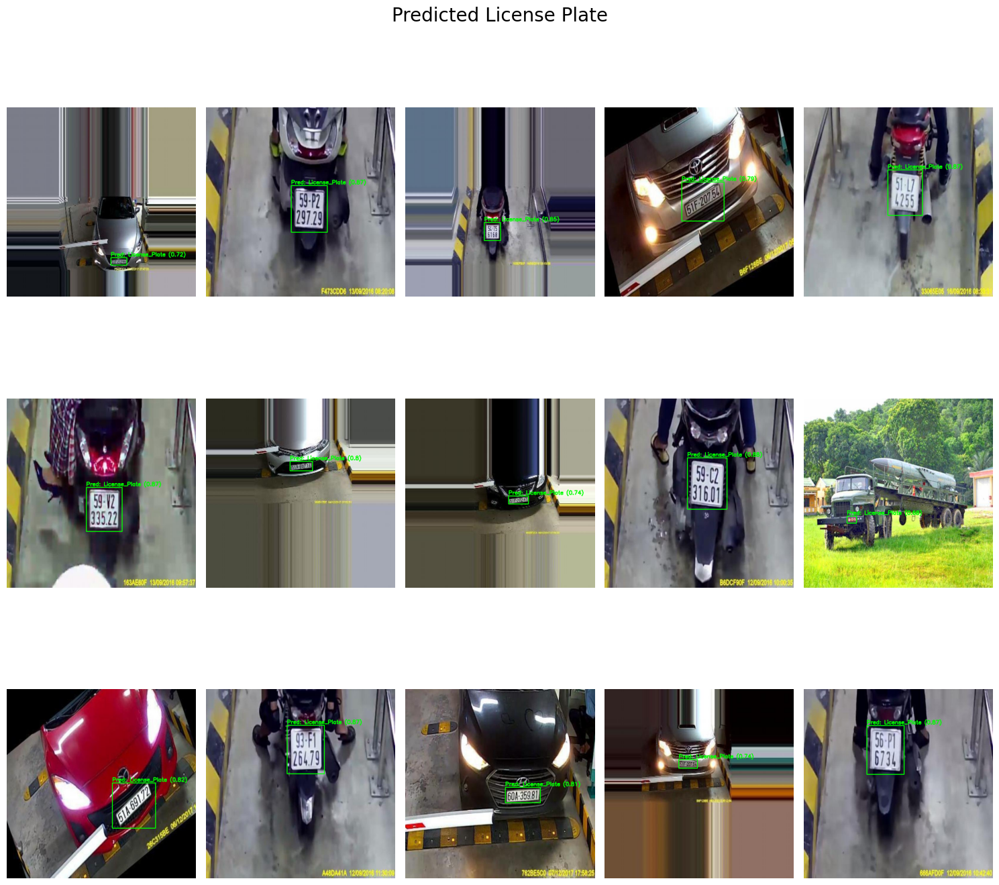

In [24]:
img_paths = list(os.listdir('/content/License-Plate-Recognition-4/test/images'))
img_paths = shuffle(img_paths)


plt.figure(figsize=(15, 16))

plt.suptitle('Predicted License Plate', fontsize=20,y=0.92)
for i in range(15):
    img_vis = ODImage('/content/License-Plate-Recognition-4/test/images', img_paths[i])
    plt.subplot(3, 5, i+1)
    plt.imshow(img_vis)
    plt.axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()